In [19]:
import tensorflow as tf
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA

In [55]:
mnist = tf.keras.datasets.mnist
(X_train, y_train), (X_test, y_test) = mnist.load_data()
print(f'training set {X_train.shape} \ntraining labels {X_train.shape} \ntest set {X_train.shape} \ntest labels {X_train.shape} \n')
X_train = X_train.reshape((X_train.shape[0], 784))
X_test = X_test.reshape((X_test.shape[0], 784))
print(f'after reshaping \ntraining set {X_train.shape} \ntraining labels {X_train.shape} \ntest set {X_train.shape} \ntest labels {X_train.shape} \n')

training set (60000, 28, 28) 
training labels (60000, 28, 28) 
test set (60000, 28, 28) 
test labels (60000, 28, 28) 

after reshaping 
training set (60000, 784) 
training labels (60000, 784) 
test set (60000, 784) 
test labels (60000, 784) 



In [56]:
X_trn = pd.DataFrame(X_train, columns=['P'+str(i) for i in range(784)])
X_tst = pd.DataFrame(X_test, columns=['P'+str(i) for i in range(784)])
X_trn['y'] = y_train
X_tst['y'] = y_test
X_trn.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 60000 entries, 0 to 59999
Columns: 785 entries, P0 to y
dtypes: uint8(785)
memory usage: 44.9 MB


In [58]:
#limit to just digit 1, 3, 6
X_trn = X_trn.loc[X_trn.y.isin([1,3,6])]
X_tst = X_tst.loc[X_tst.y.isin([1,3,6])]
X_trn.head()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 18791 entries, 3 to 59998
Columns: 785 entries, P0 to y
dtypes: uint8(785)
memory usage: 14.2 MB


In [60]:
y_trn = X_trn.y
y_tst = X_tst.y
X_trn.drop(['y'], axis=1, inplace=True)
X_tst.drop(['y'], axis=1, inplace=True)
X_trn.head()

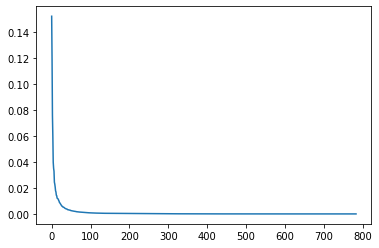

In [62]:
pca = PCA()
trn_tf = pca.fit_transform(X_trn)
plt.plot(pca.explained_variance_ratio_)

<AxesSubplot:>

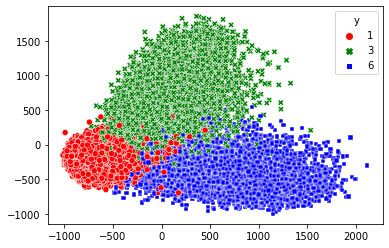

In [63]:
#let plots projected data on the first two principal components
sns.scatterplot(
    x=trn_tf[:,0],
    y=trn_tf[:,1],
    style=y_trn,
    hue=y_trn,
    palette=['red', 'green', 'blue']
)

In [64]:
# average log likelihood score of training data
print('%.2f'%pca.score(X_trn))

1037.41


<AxesSubplot:>

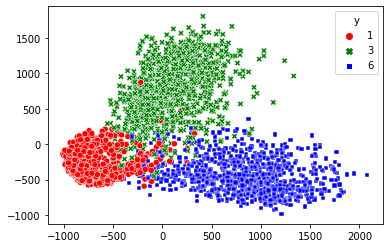

In [65]:
#Transform on test data
tst_tf = pca.transform(X_tst)

sns.scatterplot(
    x=tst_tf[:,0],
    y=tst_tf[:,1],
    style=y_tst,
    hue=y_tst,
    palette=['red', 'green', 'blue']
)

In [66]:
print('%.2f'%pca.score(X_tst))

-3444819103558831554259058688.00
